In [2]:
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
from matplotlib.pyplot import text
import numpy as np

In [28]:
fes_polar30 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy30.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar30.dropna(how="all", inplace=True)
fes_polar40 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy40.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar40.dropna(how="all", inplace=True)
fes_polar55 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes55.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar55.dropna(how="all", inplace=True)
fes_polar70 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy70.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar70.dropna(how="all", inplace=True)
fes_polar80 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy80.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar80.dropna(how="all", inplace=True)
fes_polar90 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy90.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar90.dropna(how="all", inplace=True)
fes_polar100 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy100.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar100.dropna(how="all", inplace=True)


In [57]:
fes_polar101 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy101.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar101.dropna(how="all", inplace=True)
fes_polar120 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy120.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar120.dropna(how="all", inplace=True)
fes_polar150 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy150.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar150.dropna(how="all", inplace=True)
fes_polar200 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy200.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar200.dropna(how="all", inplace=True)

In [58]:

print(fes_polar200['fes'].max())
print(fes_polar200['fes'].min())

-13.127
-141.8


In [191]:
# hillsall100 = pd.read_fwf('/home/elaine/elaine_data/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS.ALL100', header=None, 
#                             names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
#                             comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
# hillsall90 = pd.read_fwf('/home/elaine/elaine_data/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS.ALL90', header=None, 
#                             names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
#                             comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
# hillsall80 = pd.read_fwf('/home/elaine/elaine_data/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS.ALL80', header=None, 
#                             names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
#                             comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

In [193]:
# print(hillsall80['clock'].max())
# print(hillsall90['clock'].max())
# print(hillsall100['clock'].max())

In [59]:
def plot_polar_fes(df):
    """Plot polar contour plot using free energy grid data in pandas df with cols:z,theta,fes"""
    
    z_unique = np.sort(df.z.unique())
    theta_unique = np.sort(df.theta.unique())
    values = df.pivot_table(index='z', columns='theta', values='fes').T.values
    
    # Fix missing grid data at theta=pi by duplicating the last row of fes values
    theta_unique = np.append(theta_unique, [3.142])
    values = np.append(values, [values[-1]], axis=0)
    
#     print(theta_unique)
#     print(z_unique)
#     print(values)
#     print(len(values))
#     print(len(values[0]))
#     print(len(theta_unique))
#     print(len(z_unique))
#     print(values[-1])
    
    z, theta = np.meshgrid(z_unique, theta_unique)
    fig, ax = plt.subplots(subplot_kw=dict(projection='polar'), figsize=(10,10))
    
    # Adjust plot orientation and labels
    #ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    ax.set_theta_offset(1.12) #5.2)
    #ax.set_ylim(0, 20)
    ax.tick_params(labelbottom=False, grid_color="palegreen")
    ax.set_rticks([5, 10, 15, 20])
    ax.set_thetagrids([334, 64, 154, 244])
    ax.set_rlabel_position(270)
    
    # Plot contour, specifying limits for contour boundaries and colour palette
    cont = ax.contourf(theta, z, values, levels=np.arange(-142, 20, 5), cmap='Spectral')
    
    cb = fig.colorbar(cont)
    cb.set_label("Free Energy")
    
    plt.text(3.5, 16.8, "DIV", fontsize=24)
    plt.text(1.97, 15, "DIII", fontsize=24)
    plt.text(4.9, 15.8, "DI", fontsize=24)
    plt.text(0.4, 15, "DII", fontsize=24)
    
    return fig, ax, cont

# 2D CONTOUR: FREE ENERGY SURFACES (xy plane)

* Checking convergence of fes over the last ~20ns of simulations

## Most recent FES

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7fc545963d90>)

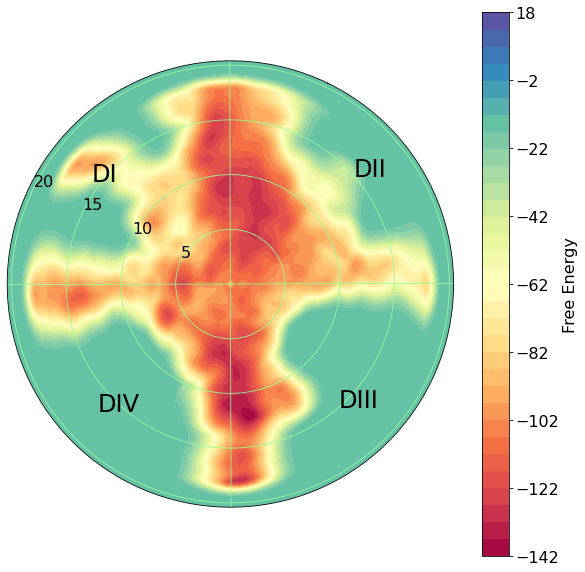

In [60]:
plot_polar_fes(fes_polar200)

## FES150

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7fc5462bee20>)

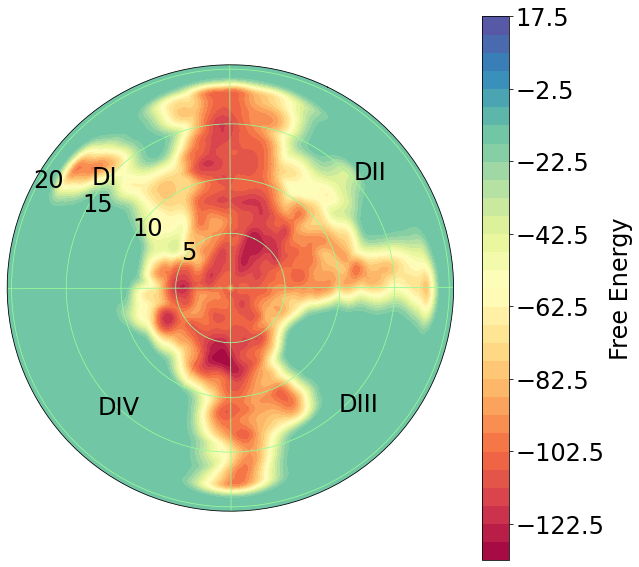

In [31]:
plot_polar_fes(fes_polar150)

## FES120

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7fc538f6c5e0>)

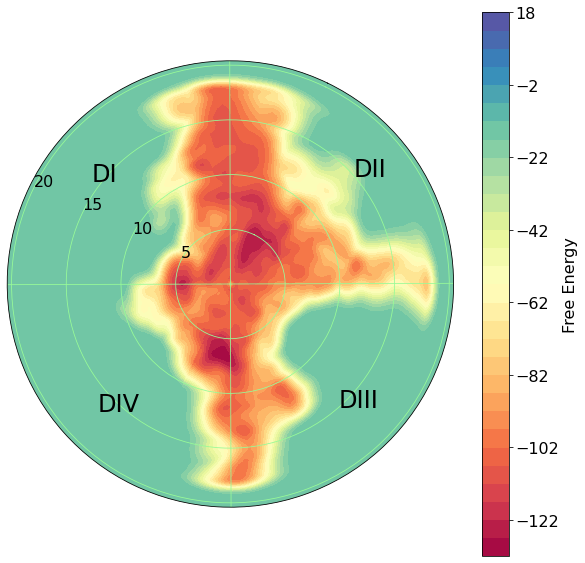

In [16]:
plot_polar_fes(fes_polar120)

## FES101 

with walker2@90 (running) , walker3 failed@60, walker4@30 (running w/ sander, walker1@60 (walkers0,5,6,7,8 complete@100ns)

* pore minima has gotten significantly deeper (126 vs 116 previously)

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7a8c0a370>)

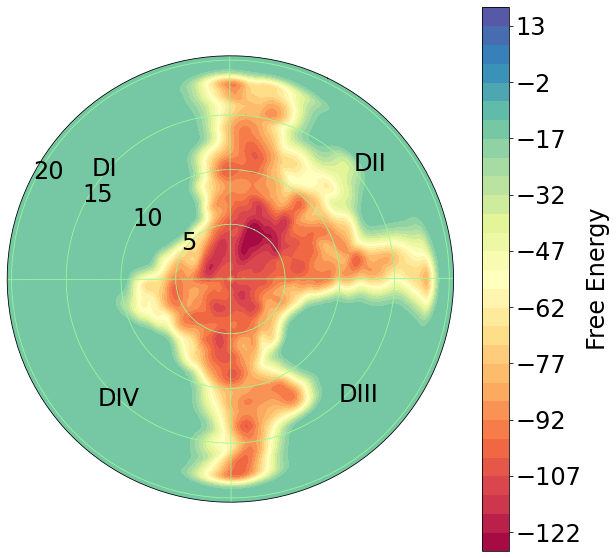

In [204]:
plot_polar_fes(fes_polar101)

## FES100 
* after walkers5,6,7,8 completed 100ns
* appearance of new minimum protruding into DIII extending from the middle of DIII-IV fenestration

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7d8107910>)

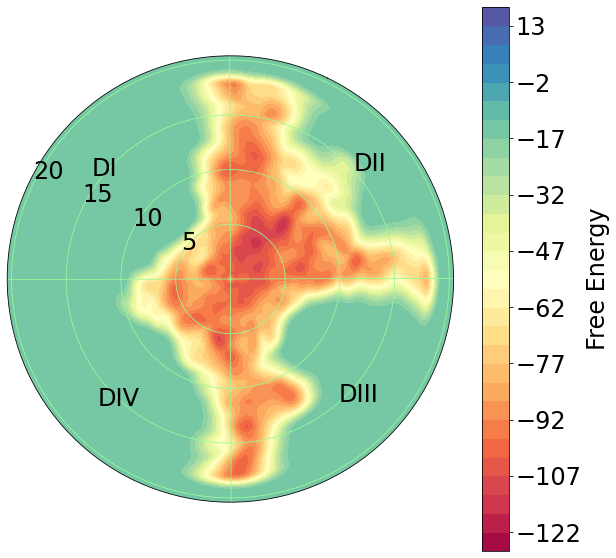

In [205]:
plot_polar_fes(fes_polar100)

## FES90

DIII-IV well sampled, up to the wall restraint boundary

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7a24d0d90>)

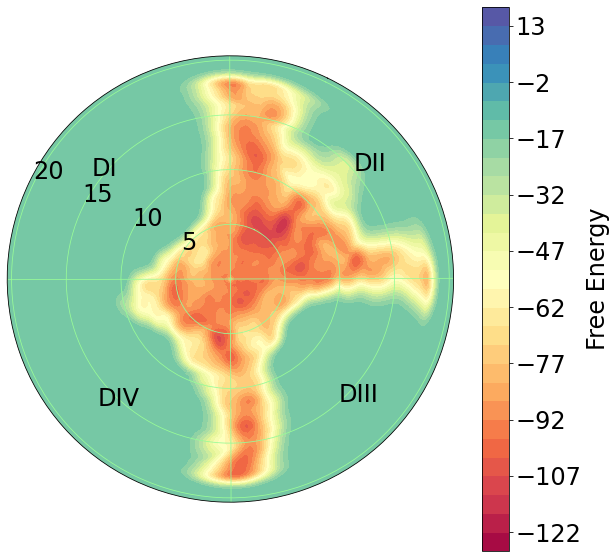

In [206]:
plot_polar_fes(fes_polar90)

## FES80


(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7d0c78310>)

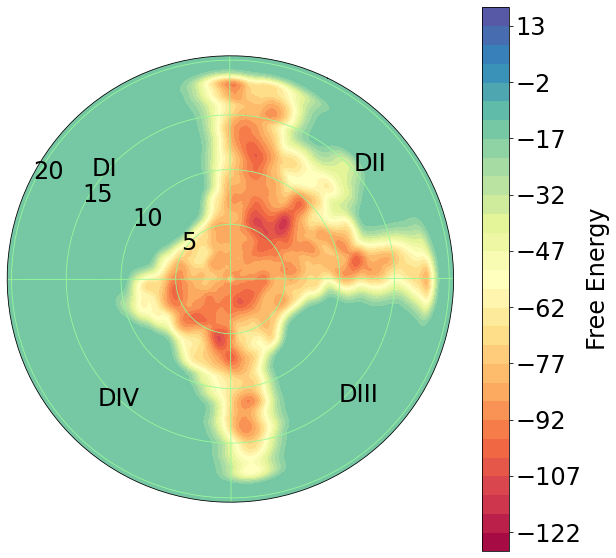

In [207]:
plot_polar_fes(fes_polar80)

# 2D FES: zr

In [103]:
fes_zr = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/feszr200.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','s','fes'])
fes_zr.dropna(how="all", inplace=True)

Text(2, -14, 'INTRACELLULAR')

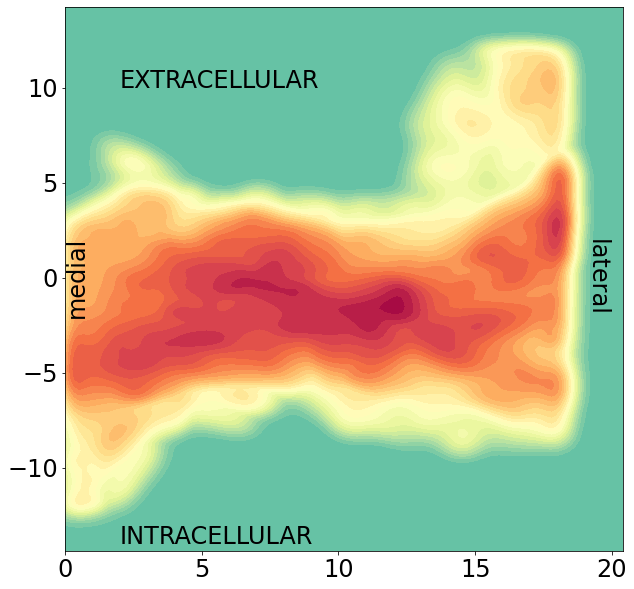

In [105]:
fig, axes = plt.subplots(figsize=(10, 10))
Z = fes_zr.pivot_table(index='z', columns='s', values='fes').T.values

X_unique = np.sort(fes_zr.z.unique())
Y_unique = np.sort(fes_zr.s.unique())
X, Y = np.meshgrid(X_unique, Y_unique)

plt.contourf(X, Y, Z, levels=np.arange(-142, 20, 5), cmap='Spectral')

text(0, 0, "medial", rotation=90, verticalalignment='center')
text(19, 0, "lateral", rotation=270, verticalalignment='center')
text(2, 10, "EXTRACELLULAR")
text(2, -14, "INTRACELLULAR")

## FESzr100

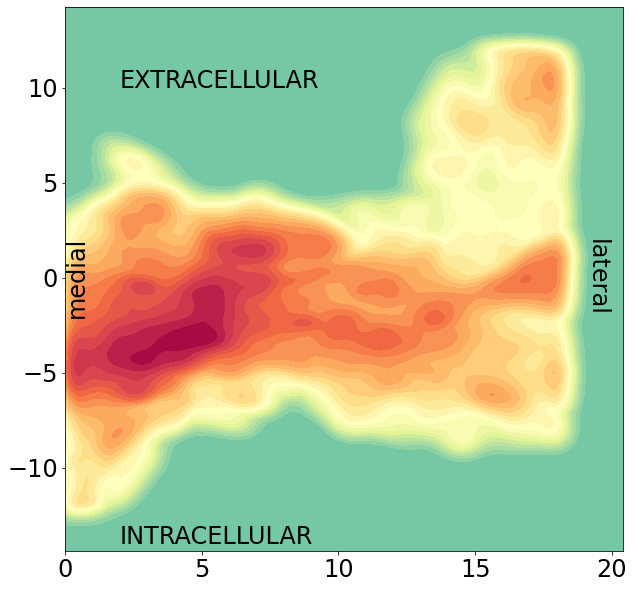

# 3D FES: slicing along fenestration axes

In [61]:
fes3d = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes3d200.grid', widths=[9,9,9,9,9,9,9], skiprows=13, header=None, names=['s', 'z', 'theta','fes', 'der_s', 'der_z', 'der_theta'])
fes3d.dropna(how="all", inplace=True)

In [70]:
# fes3d.sort_values(['s', 'y'])
print(fes3d.z.unique())
print(fes3d.theta.unique())

[ 0.     0.162  0.324  0.486  0.648  0.809  0.971  1.133  1.295  1.457
  1.619  1.781  1.943  2.104  2.266  2.428  2.59   2.752  2.914  3.076
  3.238  3.4    3.561  3.723  3.885  4.047  4.209  4.371  4.533  4.695
  4.857  5.018  5.18   5.342  5.504  5.666  5.828  5.99   6.152  6.313
  6.475  6.637  6.799  6.961  7.123  7.285  7.447  7.609  7.77   7.932
  8.094  8.256  8.418  8.58   8.742  8.904  9.065  9.227  9.389  9.551
  9.713  9.875 10.037 10.199 10.361 10.522 10.684 10.846 11.008 11.17
 11.332 11.494 11.656 11.817 11.979 12.141 12.303 12.465 12.627 12.789
 12.951 13.113 13.274 13.436 13.598 13.76  13.922 14.084 14.246 14.408
 14.57  14.731 14.893 15.055 15.217 15.379 15.541 15.703 15.865 16.026
 16.188 16.35  16.512 16.674 16.836 16.998 17.16  17.322 17.483 17.645
 17.807 17.969 18.131 18.293 18.455 18.617 18.778 18.94  19.102 19.264
 19.426 19.588 19.75  19.912 20.074 20.235 20.397]
[-3.142 -3.106 -3.071 -3.036 -3.    -2.965 -2.93  -2.895 -2.859 -2.824
 -2.789 -2.753 -2.718 -2.68

In [101]:
fes1 = fes3d[fes3d['theta'] == (-0.106)]
# print(fes1)
fes2 = fes3d[fes3d['theta'] == (0.953)]
# print(fes2)
zneg = fes2['z'] * (-1)
fes2 = fes2.drop(columns='z')
fes2['z'] = zneg

fesslice2 = pd.concat([fes1, fes2])
# print(fes1.z.unique())
# print(fes2.z.unique())
# fesslice2.z.unique

Text(10, 5, 'DII-III')

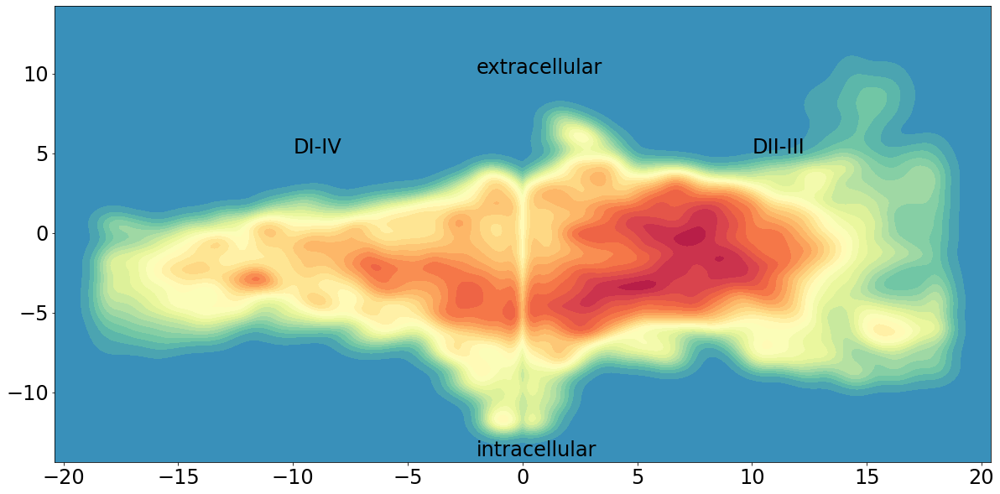

In [102]:
fig, axes = plt.subplots(figsize=(20, 10))
Z = fesslice2.pivot_table(index='z', columns='s', values='fes').T.values

X_unique = np.sort(fesslice2.z.unique())
Y_unique = np.sort(fesslice2.s.unique())
X, Y = np.meshgrid(X_unique, Y_unique)

plt.contourf(X, Y, Z, levels=np.arange(-132, 20, 5), cmap='Spectral')

# text(0, 0, "medial", rotation=90, verticalalignment='center')
# text(19, 0, "lateral", rotation=270, verticalalignment='center')
text(-2, 10, "extracellular")
text(-2, -14, "intracellular")
text(-10, 5, "DI-IV", fontsize=24)
text(10, 5, "DII-III", fontsize=24)

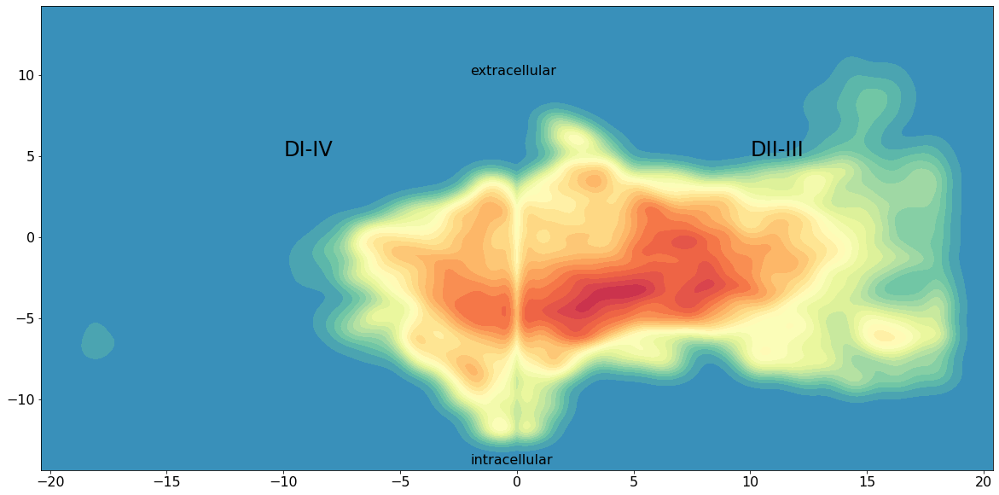

In [68]:
fes1 = fes3d[fes3d['theta'] == (0.777)]
fes2 = fes3d[fes3d['theta'] == (-0.424)]
zneg = fes2['z'] * (-1)
fes2 = fes2.drop(columns='z')
fes2['z'] = zneg

fesslice = pd.concat([fes1, fes2])
# fesslice.z.unique

Text(10, 5, 'DIII-IV')

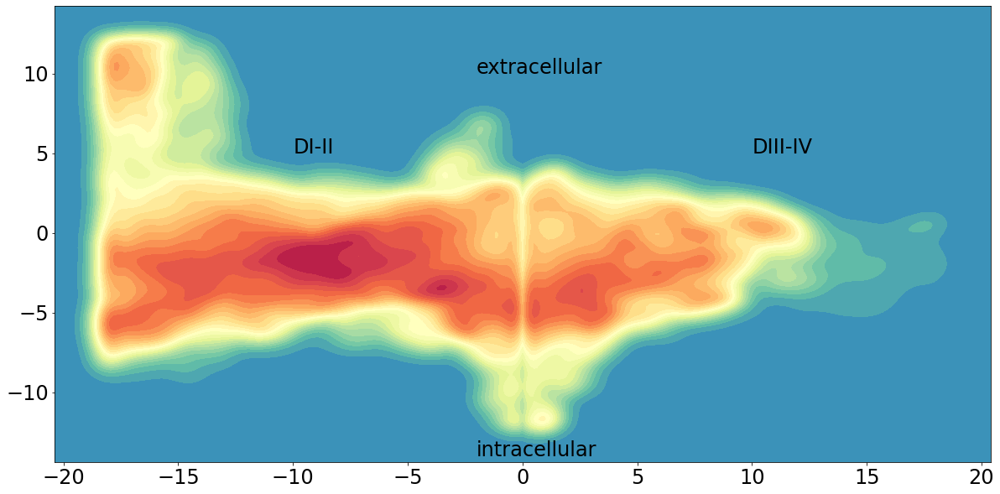

In [69]:
fig, axes = plt.subplots(figsize=(20, 10))
Z = fesslice.pivot_table(index='z', columns='s', values='fes').T.values

X_unique = np.sort(fesslice.z.unique())
Y_unique = np.sort(fesslice.s.unique())
X, Y = np.meshgrid(X_unique, Y_unique)

plt.contourf(X, Y, Z, levels=np.arange(-128, 20, 5), cmap='Spectral')

text(-2, 10, "extracellular")
text(-2, -14, "intracellular")
text(-10, 5, "DI-II", fontsize=24)
text(10, 5, "DIII-IV", fontsize=24)

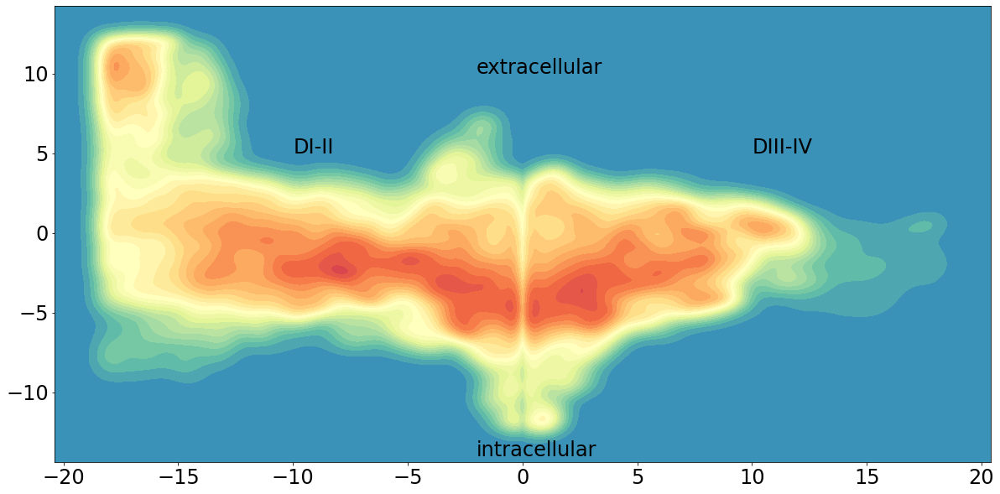
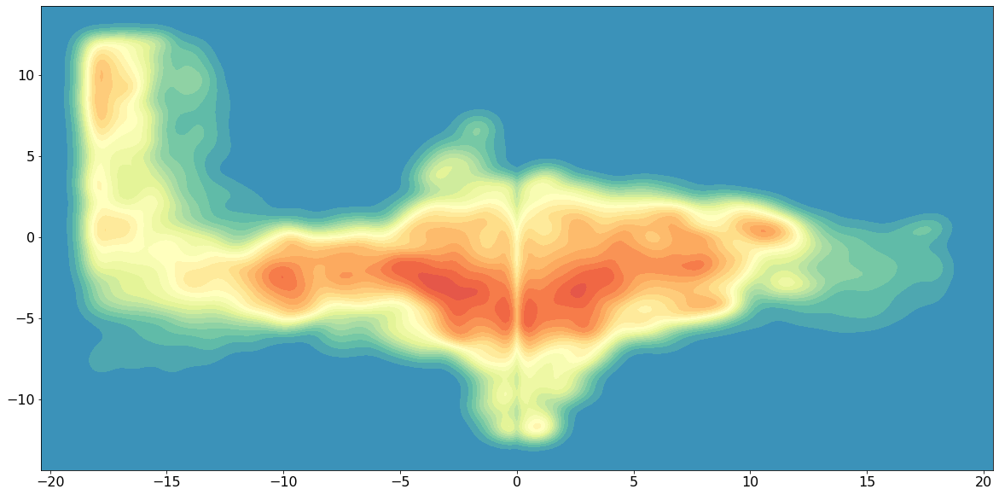
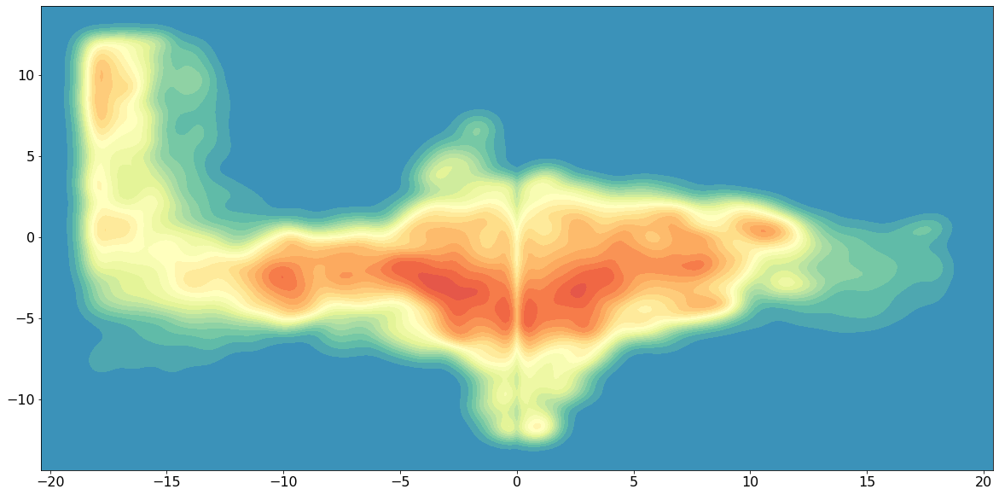

# PLOTTING HILL HEIGHTS

## Timeline of Hills Deposited by All Walkers

* Plot of Hill heights vs Wallclock time (of all walkers combined)

In [62]:
dfhills = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.ALL200', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

hills0 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.0', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

hills5 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.5', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills6 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.6', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills7 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.7', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills8 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.8', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

hills1 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.1', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills2 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.2', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills3 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.3', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills4 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.4', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])


In [63]:
hills0['walker'] = 0
hills5['walker'] = 5
hills6['walker'] = 6
hills7['walker'] = 7
hills8['walker'] = 8
hills1['walker'] = 1
hills2['walker'] = 2
hills3['walker'] = 3
hills4['walker'] = 4

hills0.drop(columns='time')
hills0['time'] = np.arange(2, len(hills0)*2+2, 2)
hills1.drop(columns='time')
hills1['time'] = np.arange(2, len(hills1)*2+2, 2)
hills2.drop(columns='time')
hills2['time'] = np.arange(2, len(hills2)*2+2, 2)
hills3.drop(columns='time')
hills3['time'] = np.arange(2, len(hills3)*2+2, 2)
hills4.drop(columns='time')
hills4['time'] = np.arange(2, len(hills4)*2+2, 2)
hills5.drop(columns='time')
hills5['time'] = np.arange(2, len(hills5)*2+2, 2)
hills6.drop(columns='time')
hills6['time'] = np.arange(2, len(hills6)*2+2, 2)
hills7.drop(columns='time')
hills7['time'] = np.arange(2, len(hills7)*2+2, 2)
hills8.drop(columns='time')
hills8['time'] = np.arange(2, len(hills8)*2+2, 2)

hills5_8_0 = pd.concat([hills5, hills6, hills7, hills8, hills0])
hills1_4 = pd.concat([hills4, hills3, hills2, hills1])

In [10]:
def sort_by_clock(df):
    df_new = df.sort_values("clock")
    df_new = df.reset_index()
    return df_new

In [70]:

# fig, ax = plt.subplots(figsize=(40, 10))
# sns.scatterplot(data=sort_by_clock(dfhills), x='index', y='heights', marker='.')

In [69]:
# fig, ax = plt.subplots(figsize=(40, 10))
# sns.scatterplot(data=sort_by_clock(dfhills), x='time', y='heights', marker='.')

Text(1617231140, 1.2, 'FES120 Written')

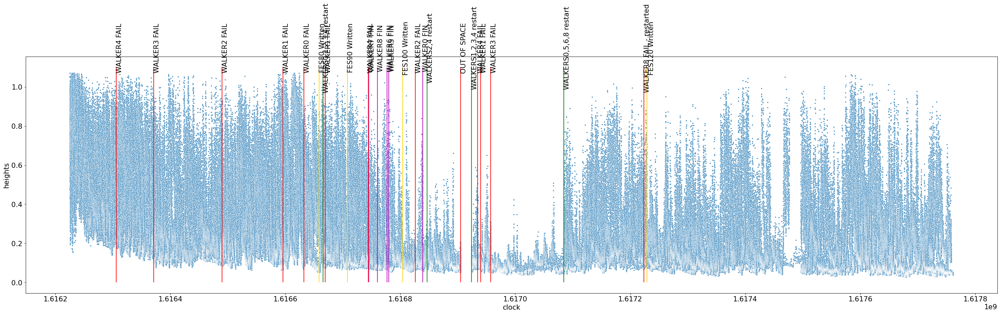

In [64]:
fig, ax = plt.subplots(figsize=(40, 10))
sns.scatterplot(data=dfhills, x='clock', y='heights', marker='.')

failed = [1616305813, 1616371126, 1616490040, 1616595928, 1616632325]
plt.vlines(x=[failed], ymin=0, ymax=1.1, color = 'r')
for i, x in enumerate(failed):
    text(x, 1.2, "WALKER%d FAIL" % (4-i), rotation=90, verticalalignment='center')
    
plt.vlines(x=[1616666000], ymin=0, ymax=1.1, color = 'g')
text(1616666000, 1.2, "WALKERS0,1,2,3,4 restart", rotation=90, verticalalignment='center')

fin = [1616780168, 1616776760, 1616745544, 1616760350, 1616838880]
plt.vlines(x=fin, ymin=0, ymax=1.1, color = 'm')
text(1616838880, 1.2, "WALKER0 FIN", rotation=90, verticalalignment='center')
text(1616780168, 1.2, "WALKER5 FIN", rotation=90, verticalalignment='center')
text(1616776760, 1.2, "WALKER6 FIN", rotation=90, verticalalignment='center')
text(1616745544, 1.2, "WALKER7 FIN", rotation=90, verticalalignment='center')
text(1616760350, 1.2, "WALKER8 FIN", rotation=90, verticalalignment='center')

plt.vlines(x=[1616669502], ymin=0, ymax=1.1, color = 'r')
text(1616669502, 1.2, "WALKER1 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616826506], ymin=0, ymax=1.1, color = 'r')
text(1616826506, 1.2, "WALKER2 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616744079], ymin=0, ymax=1.1, color = 'r')
text(1616742879, 1.2, "WALKER4 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616846512], ymin=0, ymax=1.1, color = 'g')
text(1616846512, 1.2, "WALKERS2,4 restart", rotation=90, verticalalignment='center')

plt.vlines(x=[1616904809], ymin=0, ymax=1.1, color = 'r')
text(1616904809, 1.2, "OUT OF SPACE", rotation=90, verticalalignment='center')

plt.vlines(x=[1616923834], ymin=0, ymax=1.1, color = 'g')
text(1616923834, 1.2, "WALKERS1,2,3,4 restart", rotation=90, verticalalignment='center')

plt.vlines(x=[1616939739], ymin=0, ymax=1.1, color = 'r')
text(1616939739, 1.2, "WALKER1 FAIL", rotation=90, verticalalignment='center')
plt.vlines(x=[1616934349], ymin=0, ymax=1.1, color = 'r')
text(1616934349, 1.2, "WALKER4 FAIL", rotation=90, verticalalignment='center')
plt.vlines(x=[1616957510], ymin=0, ymax=1.1, color = 'r')
text(1616957510, 1.2, "WALKER3 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616658930], ymin=0, ymax=1.1, color = 'gold')
text(1616658930, 1.2, "FES80 Written", rotation=90, verticalalignment='center')
plt.vlines(x=[1616708100], ymin=0, ymax=1.1, color = 'gold')
text(1616708100, 1.2, "FES90 Written", rotation=90, verticalalignment='center')
plt.vlines(x=[1616804314], ymin=0, ymax=1.1, color = 'gold')
text(1616804314, 1.2, "FES100 Written", rotation=90, verticalalignment='center')

plt.vlines(x=[1617084772], ymin=0, ymax=1.1, color = 'g')
text(1617084772, 1.2, "WALKERS0,5,6,8 restart", rotation=90, verticalalignment='center')
plt.vlines(x=[1617223457], ymin=0, ymax=1.1, color = 'r')
text(1617223457, 1.2, "WALKER8 FAIL - restarted", rotation=90, verticalalignment='center')
plt.vlines(x=[1617229140], ymin=0, ymax=1.1, color = 'gold')
text(1617231140, 1.2, "FES120 Written", rotation=90, verticalalignment='center')

## Checking hill heights of walkers that completed 100ns: #7,8,6,5,0 (in order of which finished first)

* Walker7 is staying exclusively within the pore cavity for the last 20ns, which appears to be in a well-sampled area, whereas Walker8 is exploring DIII-IV and is still depositing fairly large hills. Therefore, could keep running past 100ns until walker8 hill heights look like walker7...

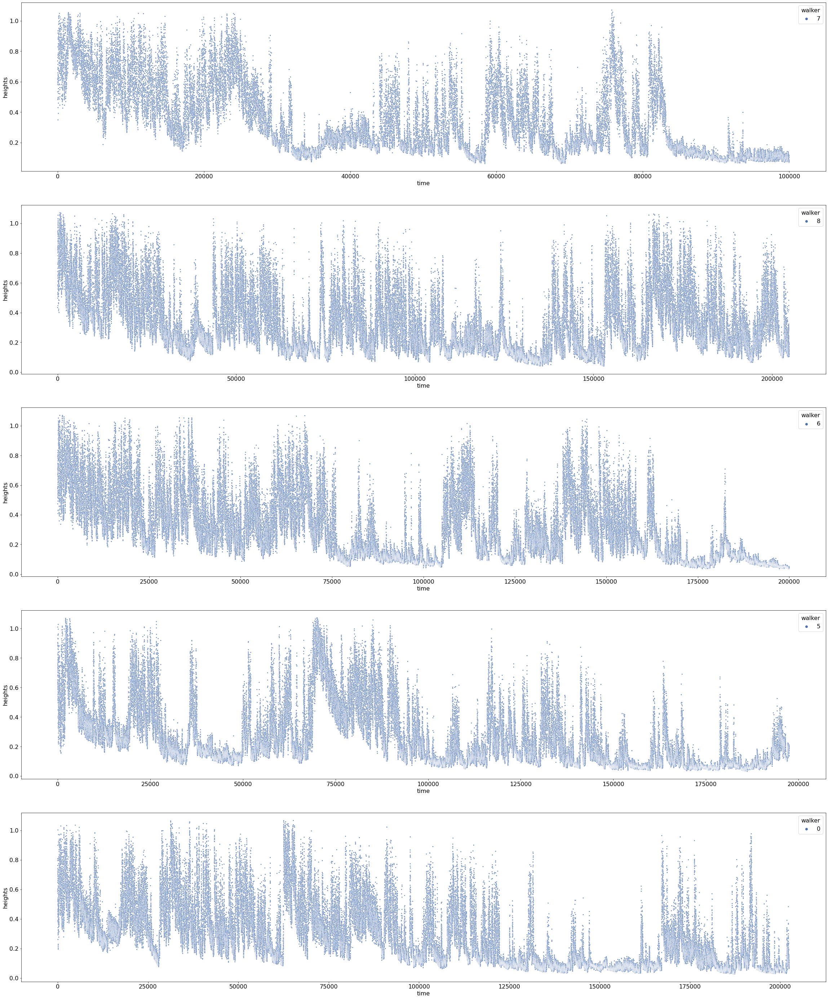

In [65]:
fig, axes = plt.subplots(5, 1, figsize=(40, 50))

sns.scatterplot(data=hills5, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[3])
sns.scatterplot(data=hills6, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[2])
sns.scatterplot(data=hills7, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[0])
sns.scatterplot(data=hills8, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[1])
sns.scatterplot(data=hills0, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[4])
plt.rcParams['font.size'] = '24'

## Checking hill heights of incomplete walkers: #1,2,3,4 that failed at various timepoints

* Given the reduced heights of these problematic walkers, perhaps not worth trying to restart them. 

<AxesSubplot:xlabel='time', ylabel='heights'>

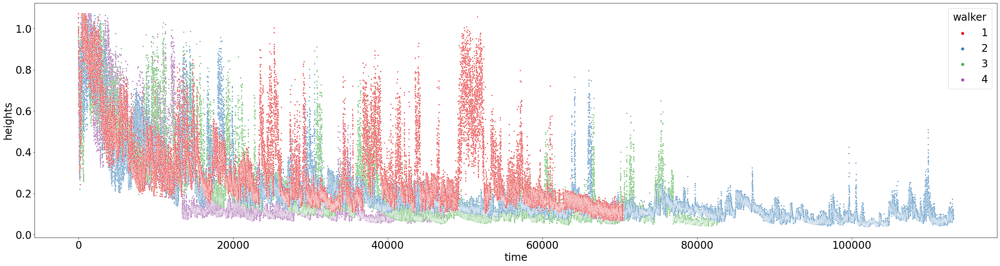

In [27]:
fig, axes = plt.subplots(figsize=(40, 10))
plt.rcParams['font.size'] = '24'
sns.scatterplot(data=hills1_4, x='time', y='heights', hue='walker', marker='.', palette='Set1')

In [153]:
# w4 failed 1616305813
# w4 restart 1616665025
# w3 failed 1616371126
# w3 restart 1616665528
# w2 failed 1616490040
# w2 restart 1616666749
# w1 failed 1616595928
# w1 restart 1616666803
# w0 failed 1616632325
# w0 restart 1616667365
# w5 fin 1616780168
# w6 fin 1616776760
# w7 fin 1616745544
# w8 fin 1616760350
# w0 fin 1616838880

# SAMPLING OF PORE SPACE: X Y Z

z and theta variables transformed to xy coordinates using:
   * x = z * sin(theta) + pi/4
   * y = z * cos(theta) + pi/4
   
in order to check sampling into each fenestration.


Harmonic restraints placed on:
* s @ 12 and -12 A (upper and lower wall restraints along pore axis)
* z @ radius of 18 A (circular wall restraint along xy plane)
- essentially defining a cylindrical boundary box centred at the protein COM to restrict lidocaine sampling 

In [145]:
# dfhills_sort = sort_by_clock(dfhills)

# x = dfhills_sort['z'] * np.sin(dfhills['theta'] + (np.pi/4))
# y = dfhills_sort['z'] * np.cos(dfhills['theta'] + (np.pi/4))
# i = np.arange(0, len(sort_by_clock(dfhills)))

# fig, axes = plt.subplots(3, 1, figsize=(20,60), sharey=True)
# sns.scatterplot(x=dfhills_sort['clock'], y=x, marker='.', ax=axes[0])
# sns.scatterplot(x=dfhills_sort['clock'], y=y, marker='.', ax=axes[1])
# sns.scatterplot(x=dfhills_sort['clock'], y=dfhills['s'], marker='.', ax=axes[2])

## Complete (100ns) walkers: 0,5,6,7,8

* extensive sampling into fenestration DI-II by walker6
* A single walker tends to explore into each fenestration, hit the wall restraints, and then return to the pore ( Walker0->DII-III; Walker6->DI-II; Walker8->DIII-IV ). Subsequent walkers to enter each fenestration tend to not traverse as far. 
* Intracellular pore opening well-sampled by Walkers0&5
* The absence of sampling into the DI-IV fenestration even under the large biasing potential strongly suggests that lidocaine cannot access this fenestration. However, is this energy barrier is directional - specifically whether lidocaine entry into DI-IV could be aided by lipid tail interactions is possible given that lipid penetration was observed in equilibrium simulations??? Thus, we can only conclude that lidocaine is likely unable to leave the pore via DI-IV. 

Text(50000, -17, 'Pore Gate')

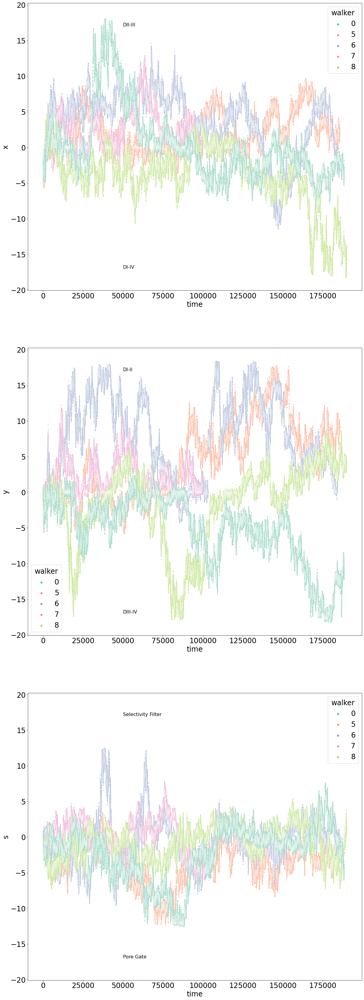

In [50]:
hills5_8_0['x'] = hills5_8_0['z'] * np.sin(hills5_8_0['theta'] + (np.pi/4))
hills5_8_0['y'] = hills5_8_0['z'] * np.cos(hills5_8_0['theta'] + (np.pi/4))

fig, axes = plt.subplots(3, 1, figsize=(20,60), sharey=True)
sns.scatterplot(data=hills5_8_0, x='time', y='x', marker='.', ax=axes[0], hue='walker', palette='Set2')
sns.scatterplot(data=hills5_8_0, x='time', y='y', marker='.', ax=axes[1], hue='walker', palette='Set2')
sns.scatterplot(data=hills5_8_0, x='time', y='s', marker='.', ax=axes[2], hue='walker', palette='Set2')

plt.rcParams['font.size'] = '16'
axes[0].text(50000, 17, "DII-III")
axes[0].text(50000, -17, "DI-IV")
axes[1].text(50000, 17, "DI-II")
axes[1].text(50000, -17, "DIII-IV")
axes[2].text(50000, 17, "Selectivity Filter")
axes[2].text(50000, -17, "Pore Gate")

## Incomplete walkers: 1,2,3,4

### FAILED WALKERS:
| Walker | Inital Fail | Restarts | Notes |
|--------|-------------| ---------|-----|
| 0      | 72ns | Restarted from 70 | COMPLETED to 100ns |
| 1      | 65ns | Restarted from 60 | Multiple restarts (tried CPU instead of GPU) - did not get past 1ns |
| 2      | 43ns | Restarted from 40; 60; 70 | ..still running |
| 3      | 27ns | Restarted from 20; 60; 60 | last fail at 65
| 4      | 13ns | Restarted from 10; 20; 30 | still running v slowly (sander)

* Lagging walkers have not sampled as far into each fenestration
* Walkers1-4 seem highly mobile and combined with the fact that heights of hill depositions is significantly reduced, suggests that the pore and fenestration space has been adequately sampled and that the energy surface has been sufficiently flattened. 
* Movement of Walker1 is confined within the pore cavity after 60ns as it repeatedly failed without writing a new restart file and was restarted using the old rst7 (hills were kept as they contributed to the metad potential of other walkers)

Text(55000, -9.5, 'Pore Gate')

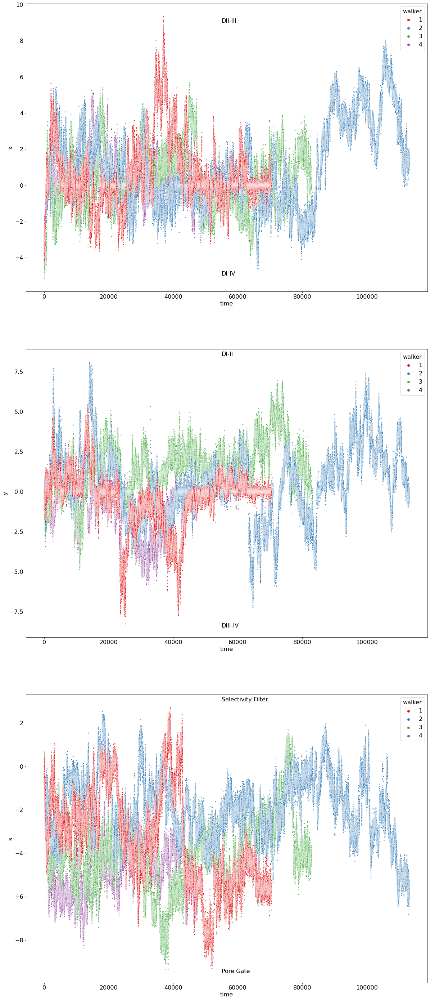

In [43]:
hills1_4['x'] = hills1_4['z'] * np.sin(hills1_4['theta'] + (np.pi/4))
hills1_4['y'] = hills1_4['z'] * np.cos(hills1_4['theta'] + (np.pi/4))

fig, axes = plt.subplots(3, 1, figsize=(20,50))
sns.scatterplot(data=hills1_4, x='time', y='x', marker='.', ax=axes[0], hue='walker', palette='Set1')
sns.scatterplot(data=hills1_4, x='time', y='y', marker='.', ax=axes[1], hue='walker', palette='Set1')
sns.scatterplot(data=hills1_4, x='time', y='s', marker='.', ax=axes[2], hue='walker', palette='Set1')

plt.rcParams['font.size'] = '16'
axes[0].text(55000, 9, "DII-III")
axes[0].text(55000, -5, "DI-IV")
axes[1].text(55000, 8.5, "DI-II")
axes[1].text(55000, -8.5, "DIII-IV")
axes[2].text(55000, 3, "Selectivity Filter")
axes[2].text(55000, -9.5, "Pore Gate")